# Analysis of Motor Vehicle Collision in the New York

By: Hoan Le and Obalanlege Adewale

# Data Pre-processing 

###Cleaning and manipulation

In [2]:

# Mount your Googledrive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#### Import Libraries needed for the analysis

 Load the CSV file into Colab and extract the year wise data

In [6]:
# Import Libraries
#for data analysis

import pandas as pd
from pandas import Series, DataFrame
import numpy as np

# for data visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_style('whitegrid')
import plotly.express as px
!pip install -U kaleido # image export package for plotly

# Import library to extract yearwise Dataframe
import datetime as dt
from datetime import datetime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 79.9 MB 126 kB/s 


In [ ]:
path = "/content/drive/MyDrive/Motor_Vehicle_Collisions_Vehicles.csv"
motor_collision_df = pd.read_csv(path)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (8) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
# get the first five rows of the raw data
motor_collision_df.head(5)

,UNIQUE_ID,COLLISION_ID,CRASH_DATE,CRASH_TIME,VEHICLE_ID,STATE_REGISTRATION,VEHICLE_TYPE,VEHICLE_MAKE,VEHICLE_MODEL,VEHICLE_YEAR,...,PRE_CRASH,POINT_OF_IMPACT,VEHICLE_DAMAGE,VEHICLE_DAMAGE_1,VEHICLE_DAMAGE_2,VEHICLE_DAMAGE_3,PUBLIC_PROPERTY_DAMAGE,PUBLIC_PROPERTY_DAMAGE_TYPE,CONTRIBUTING_FACTOR_1,CONTRIBUTING_FACTOR_2
0,10385780,100201,09/07/2012,9:03,1,NY,PASSENGER VEHICLE,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unspecified,NaN
1,19140702,4213082,09/23/2019,8:15,0553ab4d-9500-4cba-8d98-f4d7f89d5856,NY,Station Wagon/Sport Utility Vehicle,TOYT -CAR/SUV,NaN,2002.0,...,Going Straight Ahead,Left Front Bumper,Left Front Quarter Panel,NaN,NaN,NaN,N,NaN,Driver Inattention/Distraction,Unspecified
2,14887647,3307608,10/02/2015,17:18,2,NY,TAXI,NaN,NaN,NaN,...,Going Straight Ahead,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Driver Inattention/Distraction,NaN
3,14889754,3308693,10/04/2015,20:34,1,NY,PASSENGER VEHICLE,NaN,NaN,NaN,...,Parked,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unspecified,NaN
4,14400270,297666,04/25/2013,21:15,1,NY,PASSENGER VEHICLE,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Other Vehicular,NaN


We extract the year we are asked to analyze from the dataset before we start cleaning the dataset. The dataset we are asked to analyze is from 01‐Jul‐2016 to 30‐Jun‐2018.

In [ ]:
# convert to date format
motor_collision_df['CRASH_DATE'] = pd.to_datetime(motor_collision_df['CRASH_DATE'])

# Extract the data for the yearwise 
yearwise_collision_df = (motor_collision_df['CRASH_DATE'] >= '2016-07-01') & (motor_collision_df['CRASH_DATE'] <= '2018-06-30')
mvc_df = motor_collision_df.loc[yearwise_collision_df]

# Take a look at the new data extracted from the original dataset
mvc_df.head(5)

,UNIQUE_ID,COLLISION_ID,CRASH_DATE,CRASH_TIME,VEHICLE_ID,STATE_REGISTRATION,VEHICLE_TYPE,VEHICLE_MAKE,VEHICLE_MODEL,VEHICLE_YEAR,...,PRE_CRASH,POINT_OF_IMPACT,VEHICLE_DAMAGE,VEHICLE_DAMAGE_1,VEHICLE_DAMAGE_2,VEHICLE_DAMAGE_3,PUBLIC_PROPERTY_DAMAGE,PUBLIC_PROPERTY_DAMAGE_TYPE,CONTRIBUTING_FACTOR_1,CONTRIBUTING_FACTOR_2
7,17303317,3503027,2016-08-18,12:39,672828,NY,Station Wagon/Sport Utility Vehicle,FORD -CAR/SUV,NaN,2005.0,...,Going Straight Ahead,Center Front End,Center Front End,No Damage,No Damage,No Damage,N,NaN,Driver Inattention/Distraction,Unspecified
10,17285715,3487936,2016-07-22,15:40,554272,NY,Convertible,VOLK -CAR/SUV,NaN,2013.0,...,Stopped in Traffic,Right Rear Bumper,Right Rear Bumper,Center Back End,Left Rear Bumper,NaN,N,NaN,Unspecified,Unspecified
12,17307366,3499697,2016-08-13,21:05,650962,NY,Sedan,NISS -CAR/SUV,NaN,2015.0,...,Going Straight Ahead,Left Side Doors,Left Side Doors,Left Rear Quarter Panel,NaN,NaN,N,NaN,Unspecified,Unspecified
16,17401424,3516125,2016-09-08,14:40,764668,NY,Station Wagon/Sport Utility Vehicle,LINC -CAR/SUV,NaN,2015.0,...,Stopped in Traffic,Right Rear Quarter Panel,Right Rear Quarter Panel,Right Rear Bumper,No Damage,No Damage,N,NaN,Unspecified,Unspecified
22,17222837,3542089,2016-10-17,16:00,993368,NY,Pick-up Truck,freig,NaN,2006.0,...,Going Straight Ahead,Center Back End,Center Back End,NaN,NaN,NaN,N,NaN,Unspecified,Unspecified


In [ ]:
mvc_df.shape

(925901, 25)

We save the extracted data to our comuputer directory so we can focuse on it later for analysis purposes.

In [ ]:
# Save the extracted data to a directory

mvc_df.to_csv('/content/drive/MyDrive/mvc.csv')


## Data Cleaning and Wrangling

We need to make sure the data is clean before we start analysis.We should check for:

- Duplicate records
- Wrong formatting
- Missing values
- Wrong values
- Add the columns needed
- Extract the relevant Vehicle make for the analysis
- Group the Vehicle Type into similar categories


In [ ]:
# Read the extracted data 
df = pd.read_csv("/content/drive/MyDrive/mvc.csv")
# take a look at the extracted data
df.head(5)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (9) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,Unnamed: 0,UNIQUE_ID,COLLISION_ID,CRASH_DATE,CRASH_TIME,VEHICLE_ID,STATE_REGISTRATION,VEHICLE_TYPE,VEHICLE_MAKE,VEHICLE_MODEL,...,PRE_CRASH,POINT_OF_IMPACT,VEHICLE_DAMAGE,VEHICLE_DAMAGE_1,VEHICLE_DAMAGE_2,VEHICLE_DAMAGE_3,PUBLIC_PROPERTY_DAMAGE,PUBLIC_PROPERTY_DAMAGE_TYPE,CONTRIBUTING_FACTOR_1,CONTRIBUTING_FACTOR_2
0,7,17303317,3503027,2016-08-18,12:39,672828,NY,Station Wagon/Sport Utility Vehicle,FORD -CAR/SUV,NaN,...,Going Straight Ahead,Center Front End,Center Front End,No Damage,No Damage,No Damage,N,NaN,Driver Inattention/Distraction,Unspecified
1,10,17285715,3487936,2016-07-22,15:40,554272,NY,Convertible,VOLK -CAR/SUV,NaN,...,Stopped in Traffic,Right Rear Bumper,Right Rear Bumper,Center Back End,Left Rear Bumper,NaN,N,NaN,Unspecified,Unspecified
2,12,17307366,3499697,2016-08-13,21:05,650962,NY,Sedan,NISS -CAR/SUV,NaN,...,Going Straight Ahead,Left Side Doors,Left Side Doors,Left Rear Quarter Panel,NaN,NaN,N,NaN,Unspecified,Unspecified
3,16,17401424,3516125,2016-09-08,14:40,764668,NY,Station Wagon/Sport Utility Vehicle,LINC -CAR/SUV,NaN,...,Stopped in Traffic,Right Rear Quarter Panel,Right Rear Quarter Panel,Right Rear Bumper,No Damage,No Damage,N,NaN,Unspecified,Unspecified
4,22,17222837,3542089,2016-10-17,16:00,993368,NY,Pick-up Truck,freig,NaN,...,Going Straight Ahead,Center Back End,Center Back End,NaN,NaN,NaN,N,NaN,Unspecified,Unspecified


In [ ]:
df.shape

(925901, 26)

In [ ]:
# Get information about the data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 925901 entries, 0 to 925900
Data columns (total 26 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Unnamed: 0                   925901 non-null  int64  
 1   UNIQUE_ID                    925901 non-null  int64  
 2   COLLISION_ID                 925901 non-null  int64  
 3   CRASH_DATE                   925901 non-null  object 
 4   CRASH_TIME                   925901 non-null  object 
 5   VEHICLE_ID                   925901 non-null  object 
 6   STATE_REGISTRATION           856139 non-null  object 
 7   VEHICLE_TYPE                 862229 non-null  object 
 8   VEHICLE_MAKE                 832355 non-null  object 
 9   VEHICLE_MODEL                4 non-null       object 
 10  VEHICLE_YEAR                 830405 non-null  float64
 11  TRAVEL_DIRECTION             888228 non-null  object 
 12  VEHICLE_OCCUPANTS            856997 non-null  float64
 13 

In [ ]:
# List of all the columns in the data
df.columns


Index(['Unnamed: 0', 'UNIQUE_ID', 'COLLISION_ID', 'CRASH_DATE', 'CRASH_TIME',
       'VEHICLE_ID', 'STATE_REGISTRATION', 'VEHICLE_TYPE', 'VEHICLE_MAKE',
       'VEHICLE_MODEL', 'VEHICLE_YEAR', 'TRAVEL_DIRECTION',
       'VEHICLE_OCCUPANTS', 'DRIVER_SEX', 'DRIVER_LICENSE_STATUS',
       'DRIVER_LICENSE_JURISDICTION', 'PRE_CRASH', 'POINT_OF_IMPACT',
       'VEHICLE_DAMAGE', 'VEHICLE_DAMAGE_1', 'VEHICLE_DAMAGE_2',
       'VEHICLE_DAMAGE_3', 'PUBLIC_PROPERTY_DAMAGE',
       'PUBLIC_PROPERTY_DAMAGE_TYPE', 'CONTRIBUTING_FACTOR_1',
       'CONTRIBUTING_FACTOR_2'],
      dtype='object')

We add another two columns 'MONTH' and 'YEAR' to the dataframe which is subset from the original dataframe attribute 'CRASH_DATE' and we convert the output the "MONTH" attribute to show in abbriviated format.

In [ ]:
df['MONTH']= df['CRASH_DATE'].str[5:7].astype(int)
df['YEAR']= df['CRASH_DATE'].str[:4].astype(int)

df.head(5).reset_index(drop=True)

,Unnamed: 0,UNIQUE_ID,COLLISION_ID,CRASH_DATE,CRASH_TIME,VEHICLE_ID,STATE_REGISTRATION,VEHICLE_TYPE,VEHICLE_MAKE,VEHICLE_MODEL,...,VEHICLE_DAMAGE,VEHICLE_DAMAGE_1,VEHICLE_DAMAGE_2,VEHICLE_DAMAGE_3,PUBLIC_PROPERTY_DAMAGE,PUBLIC_PROPERTY_DAMAGE_TYPE,CONTRIBUTING_FACTOR_1,CONTRIBUTING_FACTOR_2,MONTH,YEAR
0,7,17303317,3503027,2016-08-18,12:39,672828,NY,Station Wagon/Sport Utility Vehicle,FORD -CAR/SUV,NaN,...,Center Front End,No Damage,No Damage,No Damage,N,NaN,Driver Inattention/Distraction,Unspecified,8,2016
1,10,17285715,3487936,2016-07-22,15:40,554272,NY,Convertible,VOLK -CAR/SUV,NaN,...,Right Rear Bumper,Center Back End,Left Rear Bumper,NaN,N,NaN,Unspecified,Unspecified,7,2016
2,12,17307366,3499697,2016-08-13,21:05,650962,NY,Sedan,NISS -CAR/SUV,NaN,...,Left Side Doors,Left Rear Quarter Panel,NaN,NaN,N,NaN,Unspecified,Unspecified,8,2016
3,16,17401424,3516125,2016-09-08,14:40,764668,NY,Station Wagon/Sport Utility Vehicle,LINC -CAR/SUV,NaN,...,Right Rear Quarter Panel,Right Rear Bumper,No Damage,No Damage,N,NaN,Unspecified,Unspecified,9,2016
4,22,17222837,3542089,2016-10-17,16:00,993368,NY,Pick-up Truck,freig,NaN,...,Center Back End,NaN,NaN,NaN,N,NaN,Unspecified,Unspecified,10,2016


### Checking for Duplicate Records

##### How many duplicate records are in the dataset there?

In [ ]:
dup_rows = df.duplicated().sum()
print('there are {} duplicated record in the dataset'.format(dup_rows))

there are 0 duplicated record in the dataset


In [ ]:
#look at number of missing values
df.isna().sum()

Unnamed: 0                          0
UNIQUE_ID                           0
COLLISION_ID                        0
CRASH_DATE                          0
CRASH_TIME                          0
VEHICLE_ID                          0
STATE_REGISTRATION              69762
VEHICLE_TYPE                    63672
VEHICLE_MAKE                    93546
VEHICLE_MODEL                  925897
VEHICLE_YEAR                    95496
TRAVEL_DIRECTION                37673
VEHICLE_OCCUPANTS               68904
DRIVER_SEX                     195634
DRIVER_LICENSE_STATUS          223366
DRIVER_LICENSE_JURISDICTION    217324
PRE_CRASH                       49144
POINT_OF_IMPACT                 49145
VEHICLE_DAMAGE                  54678
VEHICLE_DAMAGE_1               383107
VEHICLE_DAMAGE_2               526238
VEHICLE_DAMAGE_3               621756
PUBLIC_PROPERTY_DAMAGE             21
PUBLIC_PROPERTY_DAMAGE_TYPE    918954
CONTRIBUTING_FACTOR_1           35573
CONTRIBUTING_FACTOR_2           41314
MONTH       

In [ ]:
# get the total number of missing values in the extracted data
df.isna().sum().sum()

4671204

In [ ]:
# droping missing data columns and columns that are not relevant to the analysis to be carried out.
df1 = df.drop(labels=['Unnamed: 0', 
       'STATE_REGISTRATION', 'VEHICLE_MODEL', 'TRAVEL_DIRECTION','DRIVER_SEX',
       'VEHICLE_OCCUPANTS','DRIVER_LICENSE_STATUS', 'DRIVER_LICENSE_JURISDICTION', 'PRE_CRASH', 'POINT_OF_IMPACT',
       'VEHICLE_DAMAGE', 'VEHICLE_DAMAGE_1', 'VEHICLE_DAMAGE_2',
       'VEHICLE_DAMAGE_3', 'PUBLIC_PROPERTY_DAMAGE',
       'PUBLIC_PROPERTY_DAMAGE_TYPE', 'CONTRIBUTING_FACTOR_1',
       'CONTRIBUTING_FACTOR_2','VEHICLE_YEAR'], axis=1)

In [ ]:
df1.shape

(925901, 9)

In [ ]:
df1.head(5)

,UNIQUE_ID,COLLISION_ID,CRASH_DATE,CRASH_TIME,VEHICLE_ID,VEHICLE_TYPE,VEHICLE_MAKE,MONTH,YEAR
0,17303317,3503027,2016-08-18,12:39,672828,Station Wagon/Sport Utility Vehicle,FORD -CAR/SUV,8,2016
1,17285715,3487936,2016-07-22,15:40,554272,Convertible,VOLK -CAR/SUV,7,2016
2,17307366,3499697,2016-08-13,21:05,650962,Sedan,NISS -CAR/SUV,8,2016
3,17401424,3516125,2016-09-08,14:40,764668,Station Wagon/Sport Utility Vehicle,LINC -CAR/SUV,9,2016
4,17222837,3542089,2016-10-17,16:00,993368,Pick-up Truck,freig,10,2016


In [ ]:
# Check for with missing values 
df1.isna().sum()

UNIQUE_ID           0
COLLISION_ID        0
CRASH_DATE          0
CRASH_TIME          0
VEHICLE_ID          0
VEHICLE_TYPE    63672
VEHICLE_MAKE    93546
MONTH               0
YEAR                0
dtype: int64

The above shows that there are missing values in the dataset in attributes: 'VEHICLE_TYPE' and 'VEHICLE_MAKE'

In [ ]:
# droping missing value in the rows and view the first 5 rows
df1 = df1.dropna(axis=0)
df1.head(5)

,UNIQUE_ID,COLLISION_ID,CRASH_DATE,CRASH_TIME,VEHICLE_ID,VEHICLE_TYPE,VEHICLE_MAKE,MONTH,YEAR
0,17303317,3503027,2016-08-18,12:39,672828,Station Wagon/Sport Utility Vehicle,FORD -CAR/SUV,8,2016
1,17285715,3487936,2016-07-22,15:40,554272,Convertible,VOLK -CAR/SUV,7,2016
2,17307366,3499697,2016-08-13,21:05,650962,Sedan,NISS -CAR/SUV,8,2016
3,17401424,3516125,2016-09-08,14:40,764668,Station Wagon/Sport Utility Vehicle,LINC -CAR/SUV,9,2016
4,17222837,3542089,2016-10-17,16:00,993368,Pick-up Truck,freig,10,2016


In [ ]:
# Confirm if there is still missing data and the data is clean
print(df1.isnull().sum())
print(f'This new cleaned data contains {df1.shape[0]} rows and {df1.shape[1]} columns')

UNIQUE_ID       0
COLLISION_ID    0
CRASH_DATE      0
CRASH_TIME      0
VEHICLE_ID      0
VEHICLE_TYPE    0
VEHICLE_MAKE    0
MONTH           0
YEAR            0
dtype: int64
This new cleaned data contains 828163 rows and 9 columns


After cleaning the dataset, we subset the cleaned dataset to get only the VEHICLE_TYPE attributes we are interested in : "HOND", "VOLK", "FORD" and "AUDI"

`df1["VEHICLE_MAKE"]` selects the column labelled VEHICLE_MAKE. Next, `str.contains("HOND|VOLK|FORD|AUDI")` returns True if the substring `"HOND" or "VOLK" or "FORD" or "AUDI"` is found in that column. Finally, the outer `df1[]` returns a view of the rows where the `VEHICLE_MAKE` column contains the target substrings.

`df1["VEHICLE_MAKE"]` selects the column labelled VEHICLE_MAKE. Next, `str.contains("HOND|VOLK|FORD|AUDI")` returns True if the substring `"HOND" or "VOLK" or "FORD" or "AUDI"` is found in that column. Finally, the outer `new_df[]` returns a view of the rows where the `VEHICLE_MAKE` column contains the target substrings.

In [ ]:
# get the rows containing the said attributes substrings relevant to our analyses
# cleaning by subsetting the strings only to get the first 4
df1["VEHICLE_MAKE"] = df1["VEHICLE_MAKE"].str[:4]

df2 = df1[df1["VEHICLE_MAKE"].str.contains("HOND|VOLK|FORD|AUDI")]
df2.head(5).reset_index(drop=True)

,UNIQUE_ID,COLLISION_ID,CRASH_DATE,CRASH_TIME,VEHICLE_ID,VEHICLE_TYPE,VEHICLE_MAKE,MONTH,YEAR
0,17303317,3503027,2016-08-18,12:39,672828,Station Wagon/Sport Utility Vehicle,FORD,8,2016
1,17285715,3487936,2016-07-22,15:40,554272,Convertible,VOLK,7,2016
2,17420144,3563221,2016-11-18,15:15,1088245,Pick-up Truck,FORD,11,2016
3,17316201,3546261,2016-10-22,16:50,970070,Pick-up Truck,FORD,10,2016
4,17377465,3517383,2016-09-12,5:16,779814,Sedan,HOND,9,2016


In [ ]:
df2.shape

(203123, 9)

In [ ]:
# Save the cleaned and sorted data to local directory
df2.to_csv('/content/drive/MyDrive/clean_motor_vehicle_collision.csv')


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/clean_motor_vehicle_collision.csv')
df.head()

,Unnamed: 0,UNIQUE_ID,COLLISION_ID,CRASH_DATE,CRASH_TIME,VEHICLE_ID,VEHICLE_TYPE,VEHICLE_MAKE,MONTH,YEAR
0,0,17303317,3503027,2016-08-18,12:39,672828,Station Wagon/Sport Utility Vehicle,FORD,8,2016
1,1,17285715,3487936,2016-07-22,15:40,554272,Convertible,VOLK,7,2016
2,12,17420144,3563221,2016-11-18,15:15,1088245,Pick-up Truck,FORD,11,2016
3,14,17316201,3546261,2016-10-22,16:50,970070,Pick-up Truck,FORD,10,2016
4,17,17377465,3517383,2016-09-12,5:16,779814,Sedan,HOND,9,2016


In [ ]:
# Get the unique values in the vehicle types attribute in order to recategorized them
df["VEHICLE_TYPE"].unique()

array(['Station Wagon/Sport Utility Vehicle', 'Convertible',
       'Pick-up Truck', 'Sedan', 'Motorcycle', '4 dr sedan', 'Van',
       'Ambulance', '2 dr sedan', 'Tow Truck / Wrecker', 'Bus',
       'Box Truck', 'Com', 'PK', 'Taxi', 'Armored Truck', 'Carry All',
       'Refrigerated Van', 'Dump', 'FORD', 'AMBUL', '3-Door', 'Motorbike',
       'Flat Bed', 'Lift Boom', 'Garbage or Refuse', 'TOW T', 'AMB',
       'FDNY', 'COMME', 'pick', 'DELIV', 'SCOM', 'Stake or Rack', 'ambul',
       'G TOW', 'Tractor Truck Gasoline', 'PAS', 'Tractor Truck Diesel',
       'Beverage Truck', 'BOX T', 'School Bus', 'COMPA', 'SBN',
       'Flat Rack', 'Chassis Cab', 'E.M.S', 'WAGON', 'TRAIL', 'UTILI',
       'AMBU', 'SM YW', 'Van Camper', 'VAS', 'OTHER',
       'Pickup with mounted Camper', 'RENTA', 'UTIL', 'Moped', '2 DOO',
       'OML', 'QBE i', 'TRK', 'TRUCK', 'SCL', 'DUMPS', 'Open Body', 'P/U',
       'WHITE', 'Lunch Wagon', 'CARGO', 'REP', 'COM', 'SEDAN',
       'Motorscooter', 'CO', 'COMM', 'US MA',

We reclassify the vehicle type into 10 different categories for easy visualization and analyzes

In [ ]:
#Sedan
df['VEHICLE_TYPE'].replace(to_replace=['4 dr sedan', 'SEDAN','2 dr sedan','Sedan'],value= 'Sedan', inplace = True) 
# Truck
df['VEHICLE_TYPE'].replace(to_replace= ['Pick-up Truck', 'FIRE','TANK', 'tow t','pick','PICKU','Tanker','TRAIL','PICK-','G TOW','Picku','TOW T','PK','BOX T','PICK UP TR', 'Pickup with mounted Camper','BOX TRUCK','Box Truck','Tow Truck / Wrecker','Tractor Truck Diesel','Armored Truck','Tractor Truck Gasoline','Beverage Truck','Tow Truck','TRUCK'], value='Truck', inplace = True)
# Ambulance
df['VEHICLE_TYPE'].replace(to_replace= ['AMABU', 'Ambulance', 'AMBULANCE','Ambul', 'AMUBL',"ABULA",'EAMB','AMB','AMBU','AMBUL','Ambulance'], value='Ambulance',inplace= True)
# Sport utility vehicle
df['VEHICLE_TYPE'].replace(to_replace=['SUBUR', 'Utili','UTLIT','SUV','subn','SUBN-','UTIL','UTILI','Station Wagon/Sport Utility Vehicle'], value='Sport Utility Vehicle',inplace= True)
# Van
df['VEHICLE_TYPE'].replace(to_replace=['Refrigerated Van', 'van','Motorized Home','Van Camper','Vanette','VAN C','VAN/T','VAN T','VAN`'], value='Van',inplace= True)
# Motorcycle
df['VEHICLE_TYPE'].replace(to_replace=['Motorcycle', 'Motorcycle','Motorscooter', 'Moped','Motorbike'], value='Motorcycle',inplace= True)
# Bike
df['VEHICLE_TYPE'].replace(to_replace= ['Minibike', 'Bike','Bike'], value='Bike',inplace= True)
# Bus
df['VEHICLE_TYPE'].replace(to_replace= ['School Bus','SCHOO', 'Bus'], value='Bus',inplace= True)
# Passenger vehicle
df['VEHICLE_TYPE'].replace(to_replace= ['3-Door','Taxi', '4DS','PASSE','G COM', 'PASS', 'Com','COM','4D','3DC-','3DOOR','CONVE', 'Convertible','COMME'], value='Passenger Vehicle',inplace= True)
# Others
df['VEHICLE_TYPE'].replace(to_replace= [ 'Bulk Agriculture', 'E250', 'OML', 'EMS A', 'FLAT', 'Liver',
       'COURI', 'GOVER', 'SHCOO', 'Log', 'LIVER', 'SELF',  'Dump', 'Flat Bed', 'Carry All', 'NYPD', 'TCN', 'Subn', 'TRANS', 'U HAU', 'ACCEE','Lunch Wagon','ACCES', 'Tow T',
       'Pallet', 'P/U', 'VAS', 'WORK', 'Hopper', 'P/V', 'SCOM', 'OMR',  'F350', 'MINI', 'Concrete Mixer', 'Multi-Wheeled Vehicle',
        'COMM', 'U-HAU', 'FLATB', 'FLLET', 'CONST', 'Glass Rack', 'PSD', 'PAS', 'Flat Rack', 'USPS', 'RMP',
       'QBE i', 'DELV', 'ambul', '2015', 'nycta', 'CO', 'RENTA','Lift Boom', 'Chassis Cab', 'Snow Plow',
       'US MA', 'OTHER', 'C1', 'REP', 'STATE', 'APPOR',  'SM YW', 'Stake or Rack', 'UHAUL', 'SBN', 'DUMP', 'FDNY', 'OMNIB',
       'ES', 'COMPA', 'NEW Y', '2 DOO', 'DUMPS', 'POSTA', 'SCL','VAV', 'OMT', 'CARGO', 'VAB',
       'Open Body', 'TRK', 'G OMR', 'OLM', 'PC', 'UT', 'WAGON', 'E.M.S',  '.',
       'NYC A', 'SUB', 'RV', 'SELF-', 'Garbage or Refuse', 'FORD', 'DELIV', 'CAMPE',
       'WHITE'], value='Other Vehicles',inplace= True)


In [ ]:
 # View the 10 Vehicle type categories accident
df.VEHICLE_TYPE.unique()

array(['Sport Utility Vehicle', 'Passenger Vehicle', 'Truck', 'Sedan',
       'Motorcycle', 'Van', 'Ambulance', 'Bus', 'Other Vehicles', 'Bike'],
      dtype=object)

In [ ]:
# View the 10 Vehicle type categories accident count

df.VEHICLE_TYPE.value_counts()

Sedan                    102308
Sport Utility Vehicle     76259
Truck                     10922
Passenger Vehicle          6375
Van                        2734
Bus                        1620
Ambulance                  1424
Other Vehicles              796
Motorcycle                  680
Bike                          5
Name: VEHICLE_TYPE, dtype: int64

In [ ]:
if df.isna().sum().any() == False:
  print(f'This dataset is clean and it contains {df.shape[0]} rows and {df.shape[1]} columns')
else:
  print('This dataset is still dirty!')

This dataset is clean and it contains 203123 rows and 10 columns


Data cleaning is  finished!!
We are ready to answer questions, and query our data.

In [ ]:
# Saving the data to directory
df.to_csv('/content/drive/MyDrive/ny_motor_vehicle_collisions.csv')

## EXPLORATORY DATA ANALYSIS and VISUALIZATION

In [8]:
motor_collisions = pd.read_csv('/content/drive/MyDrive/ny_motor_vehicle_collisions.csv')

In [ ]:
motor_collisions.head(5)

,Unnamed: 0,Unnamed: 0.1,UNIQUE_ID,COLLISION_ID,CRASH_DATE,CRASH_TIME,VEHICLE_ID,VEHICLE_TYPE,VEHICLE_MAKE,MONTH,YEAR
0,0,0,17303317,3503027,2016-08-18,12:39,672828,Sport Utility Vehicle,FORD,8,2016
1,1,1,17285715,3487936,2016-07-22,15:40,554272,Passenger Vehicle,VOLK,7,2016
2,2,12,17420144,3563221,2016-11-18,15:15,1088245,Truck,FORD,11,2016
3,3,14,17316201,3546261,2016-10-22,16:50,970070,Truck,FORD,10,2016
4,4,17,17377465,3517383,2016-09-12,5:16,779814,Sedan,HOND,9,2016


In [ ]:
motor_collisions.columns

Index(['Unnamed: 0', 'Unnamed: 0.1', 'UNIQUE_ID', 'COLLISION_ID', 'CRASH_DATE',
       'CRASH_TIME', 'VEHICLE_ID', 'VEHICLE_TYPE', 'VEHICLE_MAKE', 'MONTH',
       'YEAR'],
      dtype='object')

In [ ]:
motor_collisions.drop(columns=['Unnamed: 0.1','Unnamed: 0'],axis =1, inplace= True)
motor_collisions.head(5)

,UNIQUE_ID,COLLISION_ID,CRASH_DATE,CRASH_TIME,VEHICLE_ID,VEHICLE_TYPE,VEHICLE_MAKE,MONTH,YEAR
0,17303317,3503027,2016-08-18,12:39,672828,Sport Utility Vehicle,FORD,8,2016
1,17285715,3487936,2016-07-22,15:40,554272,Passenger Vehicle,VOLK,7,2016
2,17420144,3563221,2016-11-18,15:15,1088245,Truck,FORD,11,2016
3,17316201,3546261,2016-10-22,16:50,970070,Truck,FORD,10,2016
4,17377465,3517383,2016-09-12,5:16,779814,Sedan,HOND,9,2016


### 1.     Which of the vehicle makes has for smallest and largest counts?





In [ ]:
yearly_accident = motor_collisions.groupby(['VEHICLE_MAKE',"YEAR"]).size().unstack()
yearly_accident 


YEAR,2016,2017,2018
VEHICLE_MAKE,,,
AUDI,2244,4580,2170
FORD,21429,41311,20102
HOND,24572,49781,25007
VOLK,3185,5910,2832


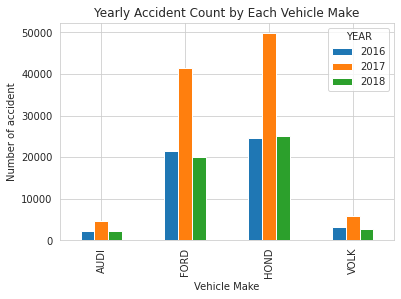

In [ ]:
# Plot of the accident count in each year

yearly_accident.plot.bar()
plt.xlabel("Vehicle Make")
plt.ylabel("Number of accident")
plt.title("Yearly Accident Count by Each Vehicle Make")
plt.savefig("yearly_accident.png")

HOND has the highest accident counts across the year from 2016 to 2017, and AUDI and VOLK accident count are almost the same, but AUDI has the lowest highest occurrence, and this may be due to minimal number of New York population using the vehicle. This might be due to maintenance issues whereby people tend to opt in for vehicle with readily available part and requires less maintenance.

### 	2.	Are some months accident prone than others?

In [10]:
data = motor_collisions.groupby(['MONTH','VEHICLE_MAKE',])['YEAR'].count()
accident_by_month = data.unstack()
accident_by_month

VEHICLE_MAKE,AUDI,FORD,HOND,VOLK
MONTH,,,,
1,658,6359,7493,882
2,564,5690,6741,866
3,717,6987,8430,1024
4,713,6380,7971,950
5,809,7588,9155,1036
6,860,7581,9338,1085
7,772,7268,8423,1072
8,771,7043,8241,977
9,788,7049,8230,998


In [ ]:
 # You should consider re-indexing it based on axis 0 (indexes)
accident_by_month.insert(0,'MONTH_NAME',['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
accident_by_month=accident_by_month.set_index('MONTH_NAME')
accident_by_month

VEHICLE_MAKE,AUDI,FORD,HOND,VOLK
MONTH_NAME,,,,
Jan,658,6359,7493,882
Feb,564,5690,6741,866
Mar,717,6987,8430,1024
Apr,713,6380,7971,950
May,809,7588,9155,1036
Jun,860,7581,9338,1085
Jul,772,7268,8423,1072
Aug,771,7043,8241,977
Sep,788,7049,8230,998


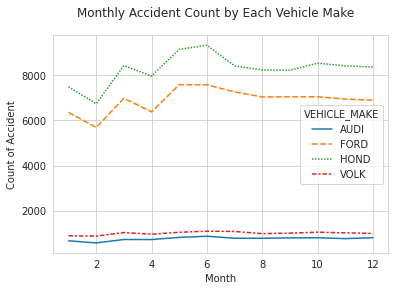

In [11]:

sns.lineplot(data = accident_by_month)
plt.suptitle("Monthly Accident Count by Each Vehicle Make")
plt.xlabel("Month")
plt.ylabel("Count of Accident")
plt.savefig("monthly_accident.png")


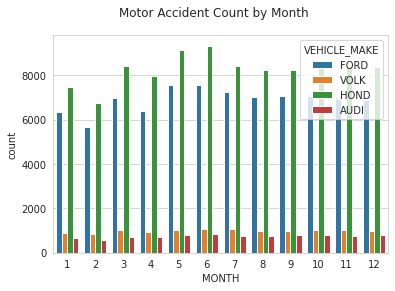

In [ ]:
plt.suptitle("Motor Accident Count by Month ")
sns.countplot(data = motor_collisions, hue ="VEHICLE_MAKE", x = 'MONTH')
plt.savefig('accident count month_bar.png')

Observation: From different plot shown above, it was obseved and recorded that the highest accident occurrence in the month in Jun. All the whole vehicle make recorded their highest number of accident this particular follow by May and then July. 
Since the month of June is summer period this justifies why it is highest because student are on break and most of the students may likely be on road during this period. Also during summer period, people tends to go on pinics, holiday trips and causing more traffic on the road.
From the trend, accident dropped drastically in July as student may be preparing for resumption. Accident in January till febuary is lowest which is Spring and accident in Winter season in comparatively than Spring. 
Accident is more prone to occur in June and Summer season compare to ther month and season.


### 	3.	Which vehicle type is more likely to be involved in an accident?

In [13]:
acccident_count_of_vehicle_type = motor_collisions.groupby(['VEHICLE_TYPE']).agg(count = ('COLLISION_ID','count'))
acccident_count_of_vehicle_type

,count
VEHICLE_TYPE,
Ambulance,1424
Bike,5
Bus,1620
Motorcycle,680
Other Vehicles,796
Passenger Vehicle,6375
Sedan,102308
Sport Utility Vehicle,76259
Truck,10922


Below is the graphical representation of the vehicle type accident count

In [12]:
fig = px.pie(data_frame= motor_collisions, values= 'COLLISION_ID', names= 'VEHICLE_TYPE' , color= 'VEHICLE_TYPE',title = "Percentage of Vehicle Type Involve in Accidents")
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()
fig.write_image("Percentage_vehicleType.jpeg")


Observation: looking at the top vehicle involved in accident, we noticed that the Sedan vehicle type is most likely with 50% accident count for the whole data set and more likely to involve in accident is the Sport Utility vehicle with 35% of total accident count.